# Install Required Packages

In [1]:
%pip install -r requirements.txt

Note: you may need to restart the kernel to use updated packages.


# Import Required Libraries
Import necessary libraries such as PyTorch, Transformers, and custom modules for data loading and preprocessing.

In [2]:
# Import Required Libraries and Utilities
import os
import torch
from torch.utils.data import Dataset
from transformers import Trainer, TrainingArguments
import pandas as pd
from sklearn.model_selection import train_test_split

from transformers import BertTokenizer, BertForSequenceClassification


from process.preprocess import get_tokenizer, tokenize_data
from process.train import train_bert_model, train_ngram_model

from process.evaluate import evaluate_bert_model, evaluate_ngram_model

from models.instances import get_bert_model, get_ngram_model

from utils.data_loader import load_data, split_data
from utils.json_loader import load_json


# For visualization
import matplotlib.pyplot as plt
import json


a:\Anaconda 3\envs\gpu_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Load and Preprocess Dataset
Load the dataset using a custom function and preprocess it by mapping labels to integers and splitting into training and validation sets.

In [3]:
# Load Configuration and Dataset
LABELS_PATH = 'constants/labels.json'
ASPECTS_PATH = 'constants/aspects.json'
DATASET_PATH = 'dataset/cleaned_reviews_zemberek.xlsx'

labels_json = load_json(LABELS_PATH)
aspects_json = load_json(ASPECTS_PATH)
LABELS = labels_json['LABELS']
ASPECTS = aspects_json['ASPECTS']

df = load_data(DATASET_PATH)
# Map 'Genel Duygu' and aspect columns to integer labels BEFORE splitting
df['Genel Duygu'] = df['Genel Duygu'].map(LABELS)
for aspect in ASPECTS:
    if aspect in df.columns:
        df[aspect] = df[aspect].map(LABELS)
train_df, val_df, _ = split_data(df)


In [4]:
# Check aspects and labels
print("Available Aspects:", ASPECTS)
print("Available Labels:", LABELS)

Available Aspects: ['Grafik', 'AI', 'Oynanis', 'Ses ve Muzik', 'Oyun Dunyasi', 'Topluluk ve Sosyal', 'Hikaye ve Senaryo', 'Performans ve Teknik']
Available Labels: {'Olumsuz': 0, 'Nötr': 1, 'Olumlu': 2}


In [5]:
print("Label values in train set:", train_df['Genel Duygu'].unique())
print("Label dtype:", train_df['Genel Duygu'].dtype)
print("Min/Max label:", train_df['Genel Duygu'].min(), train_df['Genel Duygu'].max())


Label values in train set: [1 2 0]
Label dtype: int64
Min/Max label: 0 2


# Train Sentiment Model
Train the sentiment analysis model using the modular function and configuration loaded above.

In [ ]:
# Always use the full number of possible classes for num_labels
num_labels = 3
train_bert_model(train_df, val_df, num_labels)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at dbmdz/bert-base-turkish-cased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch,Training Loss,Validation Loss
1,0.315700,0.323744
2,0.206600,0.275448
3,0.110900,0.298827


# Visualize Training Results and Make Predictions
After training, let's plot the training/validation loss and accuracy, and run some predictions using the trained model.


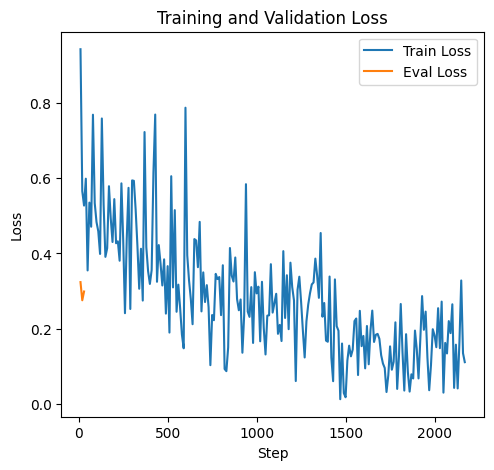

In [15]:
# Load the training log (trainer_state.json) from the last checkpoint
trainer_state_path = "output/sentiment_model/checkpoint-2175/trainer_state.json"
if not os.path.exists(trainer_state_path):
    # Try to find the latest checkpoint
    checkpoints = [d for d in os.listdir("output/sentiment_model") if d.startswith("checkpoint")]
    checkpoints = sorted(checkpoints, key=lambda x: int(x.split("-")[1]))
    trainer_state_path = f"output/sentiment_model/{checkpoints[-1]}/trainer_state.json"

with open(trainer_state_path, "r", encoding="utf-8") as f:
    trainer_state = json.load(f)

# Extract loss and accuracy
train_loss = []
eval_loss = []
eval_accuracy = []
steps = []

for log in trainer_state["log_history"]:
    if "loss" in log:
        train_loss.append(log["loss"])
        steps.append(log["step"])
    if "eval_loss" in log:
        eval_loss.append(log["eval_loss"])
    if "eval_accuracy" in log:
        eval_accuracy.append(log["eval_accuracy"])

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(steps, train_loss, label="Train Loss")
if eval_loss:
    plt.plot(steps[:len(eval_loss)], eval_loss, label="Eval Loss")
plt.xlabel("Step")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()

# Make Predictions with the Trained Model
Let's load the trained model and make predictions on a few validation samples.


In [14]:
# Find the latest checkpoint in the output directory
model_base_path = "output/sentiment_model"
checkpoints = [d for d in os.listdir(model_base_path) if d.startswith("checkpoint")]
if not checkpoints:
    raise FileNotFoundError("No checkpoints found in output/sentiment_model.")
latest_checkpoint = sorted(checkpoints, key=lambda x: int(x.split("-")[1]))[-1]
model_path = os.path.join(model_base_path, latest_checkpoint)

tokenizer = BertTokenizer.from_pretrained("dbmdz/bert-base-turkish-cased")
model = BertForSequenceClassification.from_pretrained(model_path)
model.eval()

# Pick a few samples from the validation set
sample_texts = val_df['review_text'].sample(5, random_state=42).tolist()

label_map = {0: "Olumsuz", 1: "Nötr", 2: "Olumlu"}

for text in sample_texts:
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=128)
    with torch.no_grad():
        outputs = model(**inputs)
        pred = torch.argmax(outputs.logits, dim=1).item()
    print(f"Review: {text[:100]}...")
    print(f"Predicted Sentiment: {label_map[pred]}")
    print("-" * 60)

Review: iyi oyuım_x000D_
...
Predicted Sentiment: Nötr
------------------------------------------------------------
Review: Kırmızı mercedes güzeldi sadece.Gram eğlenmedim sadece bazı yerler de korktuk o kadar iade edin...
Predicted Sentiment: Olumsuz
------------------------------------------------------------
Review: Oyun Güzel ✅...
Predicted Sentiment: Nötr
------------------------------------------------------------
Review: Benim için ilk souls-like tecrübem olup, âdeta bir destanın içine düşmüşçesine, her anı heyecan ve h...
Predicted Sentiment: Nötr
------------------------------------------------------------
Review: acayip iyi oyun...
Predicted Sentiment: Nötr
------------------------------------------------------------


In [ ]:

# Predict sentiment for all aspects and general sentiment for a few validation samples
# List of all aspect columns (from your ASPECTS variable)
aspect_columns = ASPECTS  # e.g., ["AI", "OYNANIS", "PERFORMANS VE TEKNIK", ...]

# Sample a few reviews from the validation set
sampled = val_df.sample(5, random_state=42)

label_map = {0: "Olumsuz", 1: "Nötr", 2: "Olumlu"}

for idx, row in sampled.iterrows():
    print(f"Review: {row['review_text'][:100]}...")
    aspect_preds = {}
    for aspect in ['Genel Duygu'] + aspect_columns:
        # Some reviews may have NaN for some aspects; skip if so
        if aspect not in row or pd.isna(row[aspect]):
            continue
        # Predict using the model
        inputs = tokenizer(str(row['review_text']), return_tensors="pt", truncation=True, padding=True, max_length=128)
        with torch.no_grad():
            outputs = model(**inputs)
            pred = torch.argmax(outputs.logits, dim=1).item()
        aspect_preds[aspect] = label_map[pred]
    # Print all aspect predictions
    for aspect, pred_label in aspect_preds.items():
        print(f"{aspect}: {pred_label}")
    print("-" * 60)

Review: iyi oyuım_x000D_
...
Genel Duygu: Nötr
Grafik: Nötr
AI: Nötr
Oynanis: Nötr
Ses ve Muzik: Nötr
Oyun Dunyasi: Nötr
Topluluk ve Sosyal: Nötr
Hikaye ve Senaryo: Nötr
Performans ve Teknik: Nötr
------------------------------------------------------------
Review: Kırmızı mercedes güzeldi sadece.Gram eğlenmedim sadece bazı yerler de korktuk o kadar iade edin...
Genel Duygu: Nötr
Grafik: Nötr
AI: Nötr
Oynanis: Nötr
Ses ve Muzik: Nötr
Oyun Dunyasi: Nötr
Topluluk ve Sosyal: Nötr
Hikaye ve Senaryo: Nötr
Performans ve Teknik: Nötr
------------------------------------------------------------
Review: Kırmızı mercedes güzeldi sadece.Gram eğlenmedim sadece bazı yerler de korktuk o kadar iade edin...
Genel Duygu: Olumsuz
Grafik: Olumsuz
AI: Olumsuz
Oynanis: Olumsuz
Ses ve Muzik: Olumsuz
Oyun Dunyasi: Olumsuz
Topluluk ve Sosyal: Olumsuz
Hikaye ve Senaryo: Olumsuz
Performans ve Teknik: Olumsuz
------------------------------------------------------------
Review: Oyun Güzel ✅...
Genel Duygu: Olumsu

# Baseline: N-gram TF-IDF + Logistic Regression for Sentiment Analysis
Let's build a classic NLP baseline using TF-IDF features and a linear classifier. This will provide a strong, interpretable benchmark for Turkish sentiment analysis.

# Train Multi-Aspect N-gram Model
Train the n-gram (TF-IDF + Logistic Regression) model to predict all aspects at once.

In [11]:
# Define output directory for the ngram model
ngram_output_dir = "output/ngram_model"

# List of aspect columns (excluding review_text)
aspect_cols = [col for col in train_df.columns if col not in ["review_text"]]

# Optional: Subsample for quick testing (remove/comment for full run)
# train_df_small = train_df.sample(2000, random_state=42)
# val_df_small = val_df.sample(500, random_state=42)
# Use train_df_small and val_df_small below if you want to test quickly


# Use a smaller vectorizer for memory efficiency
ngram_model = get_ngram_model(ngram_range=(1,1), max_features=2000)
X_train = train_df['review_text'].astype(str)
Y_train = train_df[aspect_cols]
ngram_model.fit(X_train, Y_train)
ngram_model.save(ngram_output_dir)

In [12]:
# Train the ngram model with robust defaults for ngram_range and max_features
train_ngram_model(
    train_df,
    val_df,
    ngram_output_dir,
    aspect_cols=aspect_cols,         # always use keyword for clarity
    ngram_range=(1,1),               # safe default for memory
    max_features=2000                # safe default for memory
)

In [13]:
# Evaluate the ngram model
results = evaluate_ngram_model(val_df, ngram_output_dir, aspect_cols=aspect_cols)

In [10]:
results

{'review_id': {'accuracy': 0.0,
  'classification_report': {'6': {'precision': 0.0,
    'recall': 0.0,
    'f1-score': 0.0,
    'support': 1.0},
   '7': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1.0},
   '14': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1.0},
   '23': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0.0},
   '27': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0.0},
   '28': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1.0},
   '31': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0.0},
   '35': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1.0},
   '52': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1.0},
   '63': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0.0},
   '66': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 0.0},
   '67': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1.0},
   '75': 

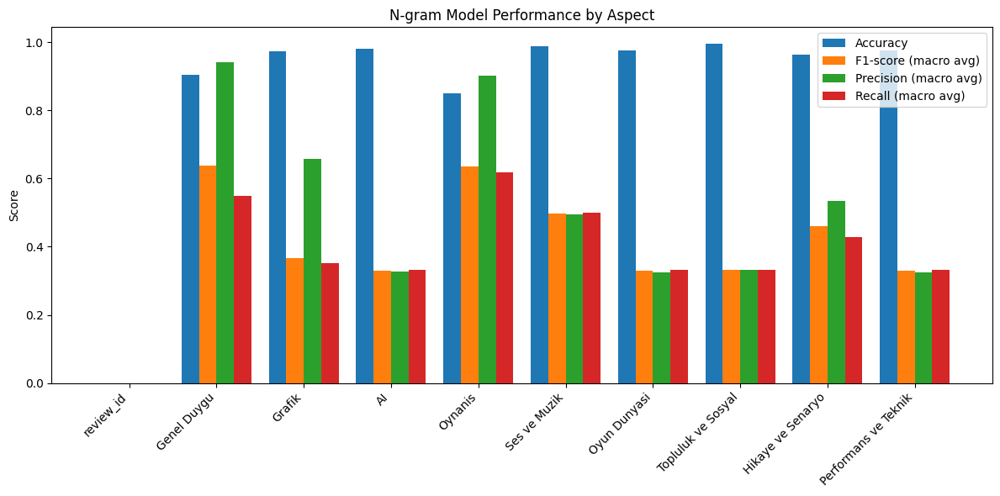

In [ ]:
# Visualize n-gram model results for all aspects
import numpy as np

def plot_ngram_aspect_results(results):
    # If results is a dict of dicts (aspect -> metrics)
    aspects = []
    accuracies = []
    f1_scores = []
    precisions = []
    recalls = []

    for aspect, metrics in results.items():
        aspects.append(aspect)
        accuracies.append(metrics.get('accuracy', 0))
        # Get macro avg for f1, precision, recall (or weighted if you prefer)
        report = metrics.get('classification_report', {})
        macro = report.get('macro avg', {})
        f1_scores.append(macro.get('f1-score', 0))
        precisions.append(macro.get('precision', 0))
        recalls.append(macro.get('recall', 0))

    x = np.arange(len(aspects))
    width = 0.2

    plt.figure(figsize=(12, 6))
    plt.bar(x - 1.5*width, accuracies, width, label='Accuracy')
    plt.bar(x - 0.5*width, f1_scores, width, label='F1-score (macro avg)')
    plt.bar(x + 0.5*width, precisions, width, label='Precision (macro avg)')
    plt.bar(x + 1.5*width, recalls, width, label='Recall (macro avg)')
    plt.xticks(x, aspects, rotation=45, ha='right')
    plt.ylabel('Score')
    plt.title('N-gram Model Performance by Aspect')
    plt.legend()
    plt.tight_layout()
    plt.show()

# Plot the results
plot_ngram_aspect_results(results)

# Make Predictions with the N-gram Model
Let's use the trained n-gram model to predict aspect sentiments for a few sample reviews from the validation set.


In [21]:

# Load the n-gram model
ngram_model = get_ngram_model(ngram_range=(1,1), max_features=2000)
ngram_model.load(ngram_output_dir)

# Sample a few reviews from the validation set
sampled_reviews = val_df['review_text'].sample(5, random_state=42).tolist()
label_map = {0: "Olumsuz", 1: "Nötr", 2: "Olumlu"}

# Reverse LABELS mapping for display
inv_LABELS = {v: k for k, v in LABELS.items()}
inv_LABELS = {v: k for k, v in sorted(inv_LABELS.items())}
label_names = [inv_LABELS.get(i, str(i)) for i in range(len(inv_LABELS))]

for review in sampled_reviews:
    predictions = ngram_model.predict([review])
    print(f"Review: {review[:100]}...")
    for aspect, pred in zip(aspect_cols, predictions.iloc[0]):
        # If label is int, map to string; else print as is
        label_str = label_names[pred] if isinstance(pred, int) and pred < len(label_names) else str(pred)
        print(f"{aspect}: {label_map.get(int(label_str), label_str)}")  
    print("-" * 60)


Review: iyi oyuım_x000D_
...
review_id: 4316
Genel Duygu: Nötr
Grafik: Nötr
AI: Nötr
Oynanis: Olumlu
Ses ve Muzik: Nötr
Oyun Dunyasi: Nötr
Topluluk ve Sosyal: Nötr
Hikaye ve Senaryo: Nötr
Performans ve Teknik: Nötr
------------------------------------------------------------
Review: Kırmızı mercedes güzeldi sadece.Gram eğlenmedim sadece bazı yerler de korktuk o kadar iade edin...
review_id: 5652
Genel Duygu: Nötr
Grafik: Nötr
AI: Nötr
Oynanis: Nötr
Ses ve Muzik: Nötr
Oyun Dunyasi: Nötr
Topluluk ve Sosyal: Nötr
Hikaye ve Senaryo: Nötr
Performans ve Teknik: Nötr
------------------------------------------------------------
Review: Oyun Güzel ✅...
review_id: 4279
Genel Duygu: Nötr
Grafik: Nötr
AI: Nötr
Oynanis: Olumlu
Ses ve Muzik: Nötr
Oyun Dunyasi: Nötr
Topluluk ve Sosyal: Nötr
Hikaye ve Senaryo: Nötr
Performans ve Teknik: Nötr
------------------------------------------------------------
Review: Benim için ilk souls-like tecrübem olup, âdeta bir destanın içine düşmüşçesine, her anı heyec